# Homework 1: Panorama stitching

**Student**: Oguzhan Aksoy

### Importing necessary modules

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imutils
import os
import glob

## Panorama Construction

We define convert_result and plot_images, for manipulating and showcasing images. We load a series of images from files matching the 'img*.jpg' pattern in the current directory, and we present the first two images using the plot_images function.

In [ ]:
def convert_result(img):
    '''
    in order to display the correct output with matplotlib,
    we need to reduce the range of our floating point image from [0,255] to [0,1]
    and convert the image from BGR to RGB:'''
    img = np.array(img,dtype=float)/float(255)
    img = img[:,:,::-1]
    return img

# We load our images in the directory to list_images list
list_images = []
for j in sorted(glob.glob('img*.jpg')):
  image = cv2.imread(j)
  list_images.append(image)

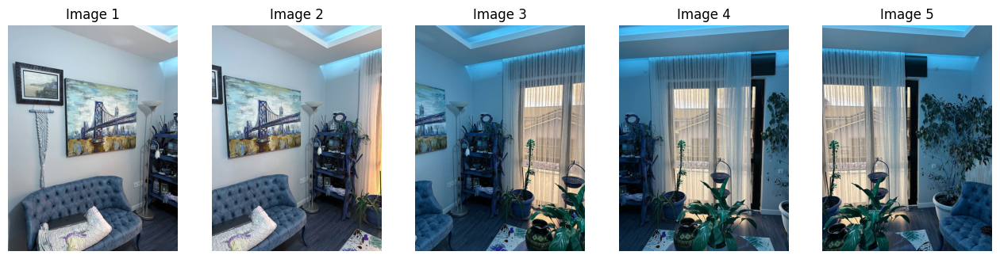

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(list_images), figsize=(16,8))
ax = axes.ravel()
for n in range(len(list_images)):
    ax[n].imshow(list_images[n])
    ax[n].set_title(f"Image {n+1}")
    ax[n].axis("off")

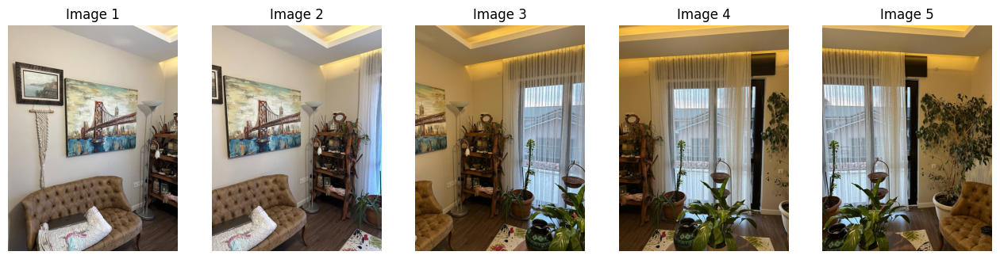

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(list_images), figsize=(16,8))
ax = axes.ravel()
for n in range(len(list_images)):
    ax[n].imshow(convert_result(list_images[n]))
    ax[n].set_title(f"Image {n+1}")
    ax[n].axis("off")

We define two functions, get_kp_and_des and draw_kps, for extracting key points and descriptors using the SIFT algorithm and visually representing those key points on images. We then apply these functions to the first two images in list_images and display the images side by side with drawn key points. We've seen `detectAndCompute` usage in seminar 5. Keypoints are the important locator points in the image, while the descriptors provide valuable and algorithm-dependent information about these points.

In [ ]:
def get_kp_and_des(image):
  """
  Extracts key points and descriptors from an input image using the SIFT algorithm.
  """
  sift = cv2.SIFT_create()

  # Find key points and compute descriptors
  keypoints, descriptors = sift.detectAndCompute(image, None)

  descriptors = np.float32(descriptors)
  return keypoints, descriptors

def draw_kps(img, kp):
  """
  Draws key points on an input image.
  """
  img1 = img
  cv2.drawKeypoints(img, kp, img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return img1

k0, d0 = get_kp_and_des(list_images[0])
k1, d1 = get_kp_and_des(list_images[1])

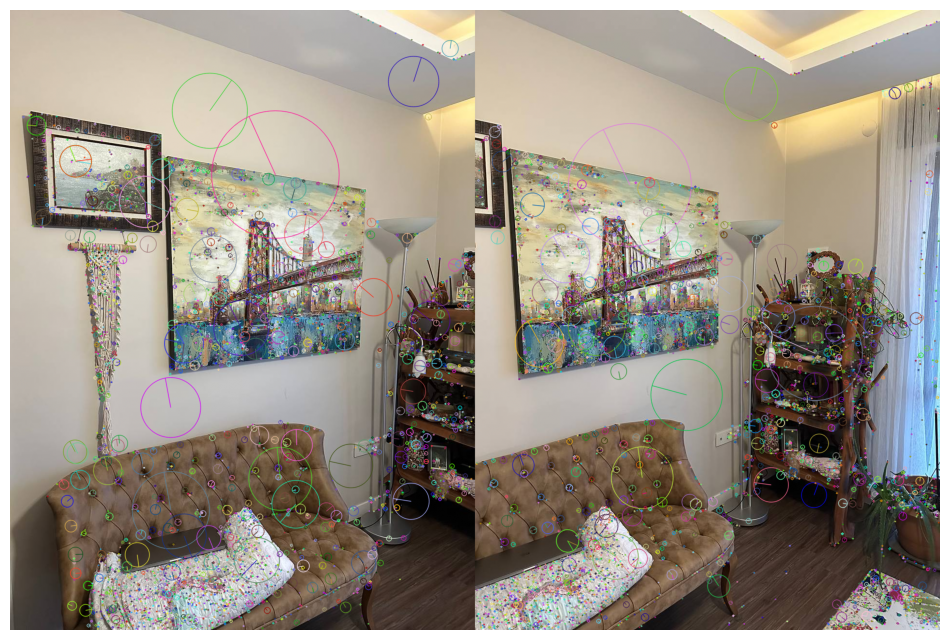

In [ ]:
img0_kp = draw_kps(list_images[0].copy(), k0)
img1_kp = draw_kps(list_images[1].copy(), k1)

plt_img = np.concatenate((img0_kp, img1_kp), axis=1)
plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(convert_result(plt_img))

Now, we implement the functions to match descriptors between two images using the BruteForce algorithm, compute the Homography matrix, and draw the matches. We then demonstrate these functions using the descriptors extracted from the first two images in list_images.

`match_descriptors(descriptors_A, descriptors_B)` \\
This function takes two sets of descriptors (descriptors_A and descriptors_B) and performs descriptor matching using the BruteForce algorithm. It applies the k-NN matching technique with k=2, and Lowe's ratio test is used to filter and retain only the good matches.

`generate_homography(src_img, dst_img)` \\
Given a source image (src_img) and a destination image (dst_img), this function computes the Homography matrix using RANSAC for robustness. It returns the Homography matrix (H) and a mask indicating the inliers.

`draw_matches(src_img, src_kp, dst_img, dst_kp, matches, matchesMask)` \\
This function visualizes the matches between two images by drawing them on a new image. It uses the provided matches, key points, and masks to highlight the inliers.

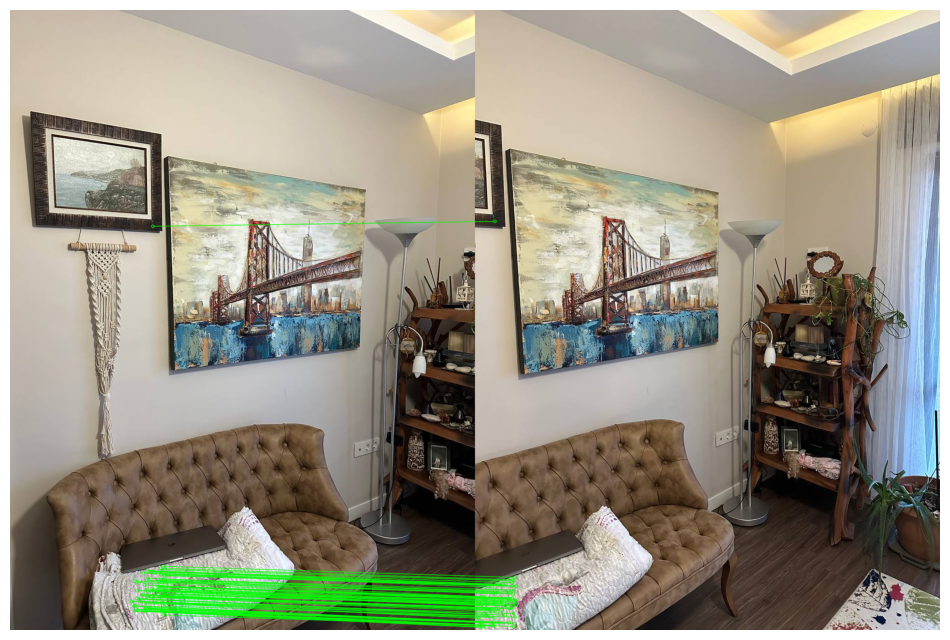

In [ ]:
def match_descriptors(descriptors_A, descriptors_B):
  """
    matching descriptors beetween 2 descriptors.
    BruteForce algorithm is used.
  """

  descriptor_matcher = cv2.DescriptorMatcher_create("BruteForce")
  # k-NN matching between the two feature vector sets using k=2
  # (indicating the top two matches for each feature vector are returned).
  matches = descriptor_matcher.knnMatch(descriptors_A, descriptors_B, k=2)

  # store all the good matches as per Lowe's ratio test
  good = []
  for m, n in matches:
    if m.distance < 0.75 * n.distance:
      good.append(m)
  if len(good) > 4:
    return good

def generate_homography(src_img, dst_img):
  """
      @Return Homography matrix,
      src_img is the image which is warped by homography,
      dst_img is the image which is choosing as pivot,
      """

  src_kp, src_features = get_kp_and_des(src_img)
  dst_kp, dst_features = get_kp_and_des(dst_img)

  good = match_descriptors(src_features, dst_features)

  src_points = np.float32([src_kp[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
  dst_points = np.float32([dst_kp[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

  H, mask = cv2.findHomography(src_points, dst_points, cv2.RANSAC, 5.0)
  matchesMask = mask.ravel().tolist()
  return H, matchesMask

def draw_matches(src_img, src_kp, dst_img, dst_kp, matches, matchesMask):
  draw_params = dict(
      matchColor=(0, 255, 0),  # draw matches in green color
      singlePointColor=None,
      matchesMask=matchesMask[:100],  # draw only inliers
      flags=2,
  )
  return cv2.drawMatches(src_img, src_kp, dst_img, dst_kp, matches[:100], None, **draw_params)

#matching features using BruteForce
mat = match_descriptors(d0, d1)

#Computing Homography matrix and mask
H,matMask = generate_homography(list_images[0],list_images[1])

#draw matches
img = draw_matches(list_images[0],k0,list_images[1],k1,mat,matMask)
plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(convert_result(img))

Now that we've found and drawn the matches, let's start preprocessing image pairs for stitching.

The cell below comprises functions essential for blending and cropping images to create a seamless panorama. The `crop` function is responsible for cropping our panorama based on destination dimensions, utilizing the corners of both the warped and destination images. The `blending_mask` function generates a blending mask, considering a specified barrier and smoothing window, with an option for left or right bias.

The `panorama_blending` function blends two images, allowing for visualization at intermediate steps if specified. It considers whether the source image is on the left or right side of the destination image. The `warp_two_images` function warps a source image onto a destination image using a homography matrix, blends them to form a panorama, and then crops the resulting image to remove black regions.

Finally, we use these functions to warp and blend two images (list_images[0] and list_images[1]). The left side of the panorama before cropping is displayed as a visual representation.

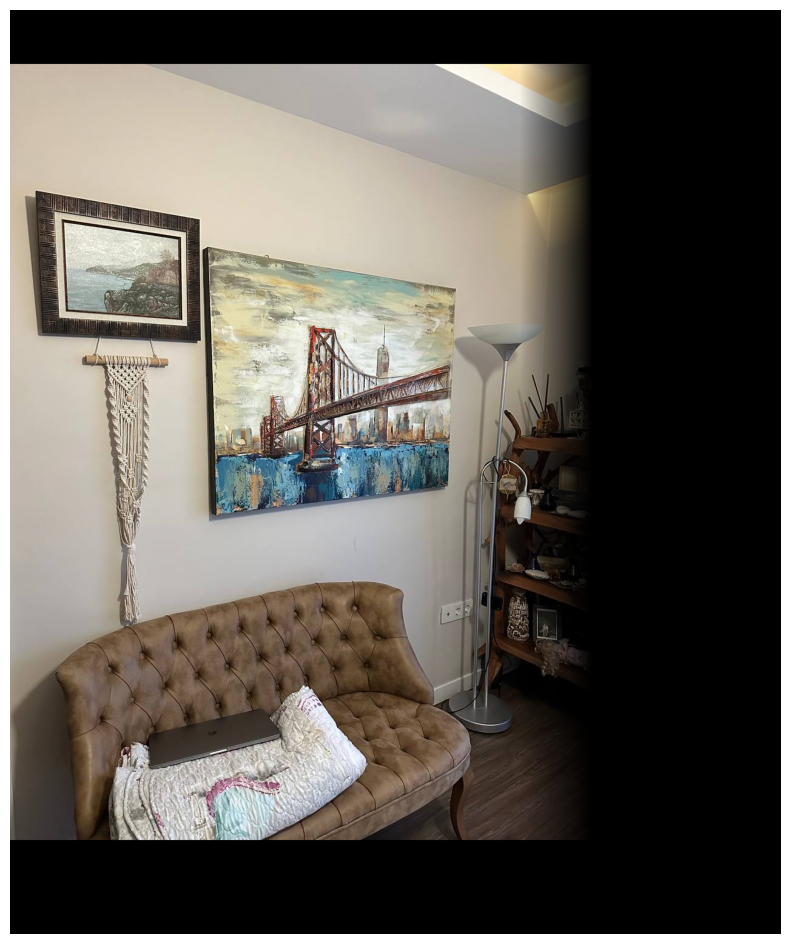

In [ ]:
def crop(panorama, h_dst, corners):
  """
    Crop panorama based on destination.
    panorama is the panorama
    h_dst is the height of destination image
    corner is the tuple which containing 4 corners of warped image and 4 corners of destination image
  """

  # find max min of x,y coordinate
  [xmin, ymin] = np.int32(corners.min(axis=0).ravel() - 0.5)
  t = [-xmin, -ymin]
  corners = corners.astype(int)

  # corners[0][0][0] is the X coordinate of top-left point of warped image
  # If it has a negative value, warp image is merged to the left side of destination image
  # otherwise is merged to the right side of destination image
  if corners[0][0][0] < 0:
    n = abs(-corners[1][0][0] + corners[0][0][0])
    panorama = panorama[t[1] : h_dst + t[1], n:, :]
  else:
    if corners[2][0][0] < corners[3][0][0]:
      panorama = panorama[t[1] : h_dst + t[1], 0 : corners[2][0][0], :]
    else:
      panorama = panorama[t[1] : h_dst + t[1], 0 : corners[3][0][0], :]
  return panorama

def blending_mask(height, width, barrier, smoothing_window, left_biased=True):
  assert barrier < width
  mask = np.zeros((height, width))

  offset = int(smoothing_window / 2)
  try:
    if left_biased:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(1, 0, 2 * offset + 1).T, (height, 1))
      mask[:, : barrier - offset] = 1
    else:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(0, 1, 2 * offset + 1).T, (height, 1))
      mask[:, barrier + offset :] = 1
  except BaseException:
    if left_biased:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(1, 0, 2 * offset).T, (height, 1))
      mask[:, : barrier - offset] = 1
    else:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(0, 1, 2 * offset).T, (height, 1))
      mask[:, barrier + offset :] = 1

  return cv2.merge([mask, mask, mask])


def panorama_blending(dst_img_rz, src_img_warped, width_dst, side, showstep=False):
  """
    Blend two images to create a seamless panorama.
  """
  h, w, _ = dst_img_rz.shape
  smoothing_window = int(width_dst / 8)
  barrier = width_dst - int(smoothing_window / 2)
  mask1 = blending_mask(h, w, barrier, smoothing_window=smoothing_window, left_biased=True)
  mask2 = blending_mask(h, w, barrier, smoothing_window=smoothing_window, left_biased=False)

  if showstep:
    nonblend = src_img_warped + dst_img_rz
  else:
    nonblend = None
    leftside = None
    rightside = None

  if side == "left":
    dst_img_rz = cv2.flip(dst_img_rz, 1)
    src_img_warped = cv2.flip(src_img_warped, 1)
    dst_img_rz = dst_img_rz * mask1
    src_img_warped = src_img_warped * mask2
    pano = src_img_warped + dst_img_rz
    pano = cv2.flip(pano, 1)
    if showstep:
      leftside = cv2.flip(src_img_warped, 1)
      rightside = cv2.flip(dst_img_rz, 1)
  else:
    dst_img_rz = dst_img_rz * mask1
    src_img_warped = src_img_warped * mask2
    pano = src_img_warped + dst_img_rz
    if showstep:
      leftside = dst_img_rz
      rightside = src_img_warped

  return pano, nonblend, leftside, rightside

def warp_two_images(src_img, dst_img, showstep=False):
  """
    Warps a source image onto a destination image using a homography matrix and blends them to create a seamless panorama.
  """
  # generate Homography matrix
  H, _ = generate_homography(src_img, dst_img)

  # get height and width of two images
  height_src, width_src = src_img.shape[:2]
  height_dst, width_dst = dst_img.shape[:2]

  # extract corners of two images: top-left, bottom-left, bottom-right, top-right
  pts1 = np.float32([[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]).reshape(-1, 1, 2)
  pts2 = np.float32([[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]).reshape(-1, 1, 2)

  # apply homography to corners of src_img
  pts1_ = cv2.perspectiveTransform(pts1, H)
  pts = np.concatenate((pts1_, pts2), axis=0)

  # find max min of x,y coordinate
  [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
  [_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
  t = [-xmin, -ymin]

  # top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
  # otherwise side=right
  # source image is merged to the left side or right side of destination image
  if pts[0][0][0] < 0:
      side = "left"
      width_pano = width_dst + t[0]
  else:
      width_pano = int(pts1_[3][0][0])
      side = "right"
  height_pano = ymax - ymin

  Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
  src_img_warped = cv2.warpPerspective(
      src_img, Ht.dot(H), (width_pano, height_pano)
  )

  # generating size of dst_img_rz which has the same size as src_img_warped
  dst_img_rz = np.zeros((height_pano, width_pano, 3))
  if side == "left":
    dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
  else:
    dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

  # blending panorama
  pano, nonblend, leftside, rightside = panorama_blending(dst_img_rz, src_img_warped, width_dst, side, showstep=showstep)

  # croping black region
  pano = crop(pano, height_dst, pts)
  return pano, nonblend, leftside, rightside

pano,non_blend,left_side,right_side = warp_two_images(list_images[1],list_images[0],True)

# display the leftside of pano before cropping
plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(convert_result(left_side))

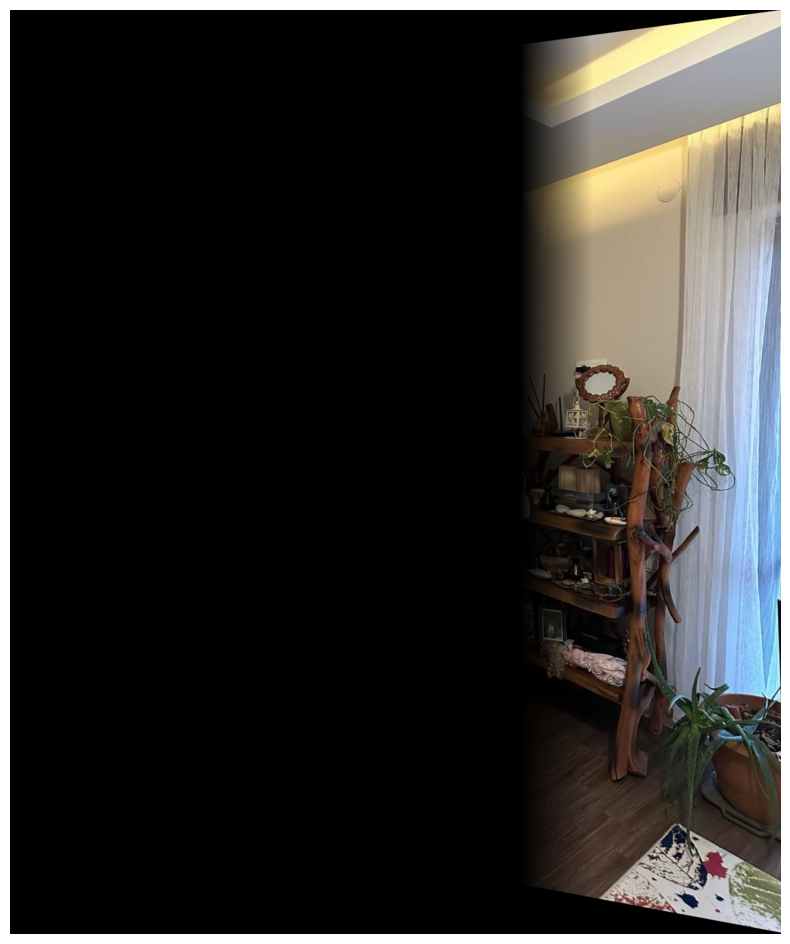

In [ ]:
# display the rightside of pano before cropping
plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(convert_result(right_side))

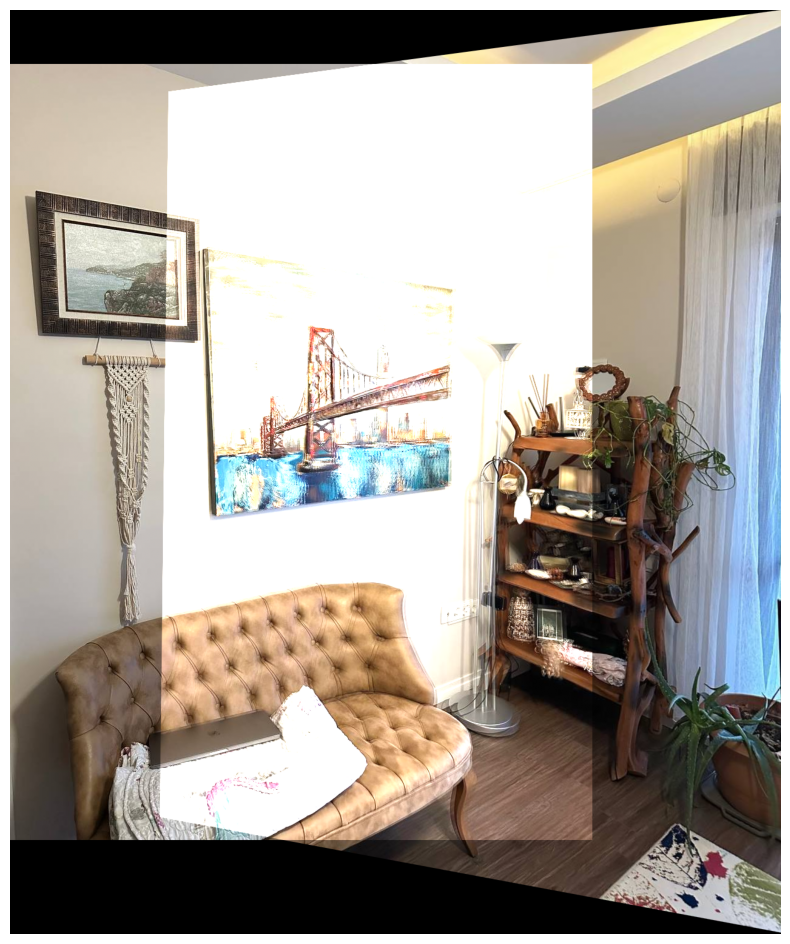

In [ ]:
# display pano without cropping and blending
plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(convert_result(non_blend))

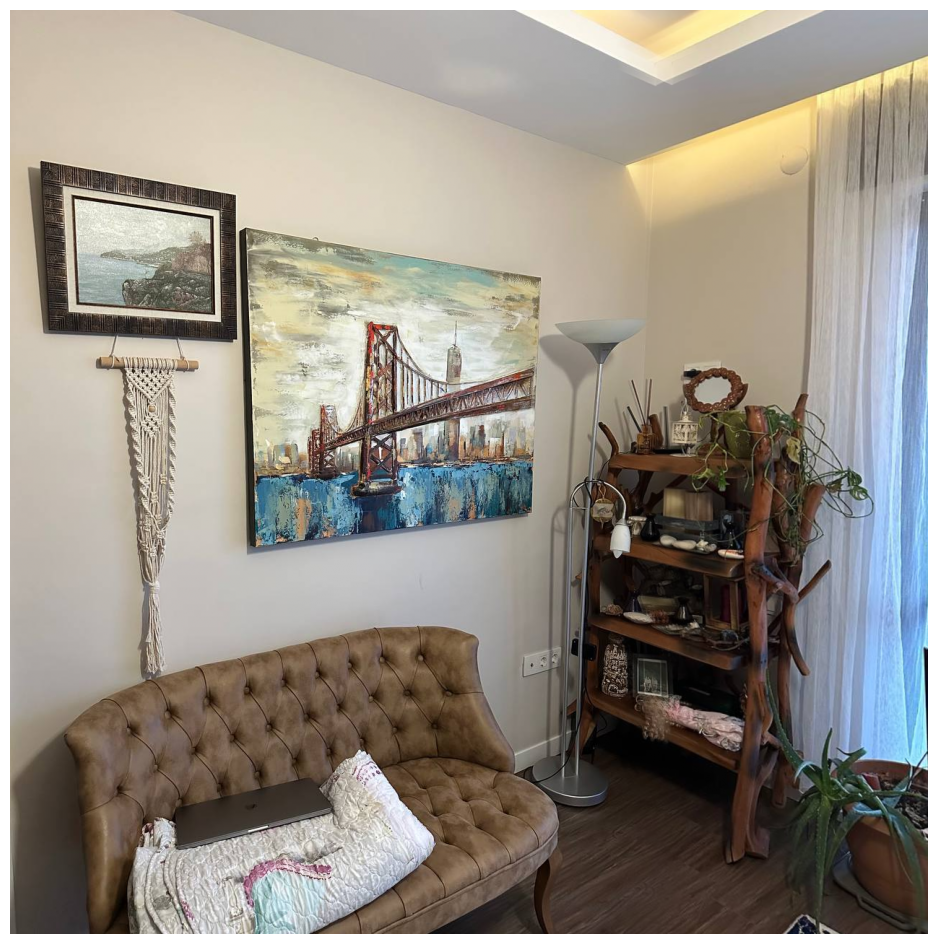

In [ ]:
# pano after cropping and blending
plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(convert_result(pano))

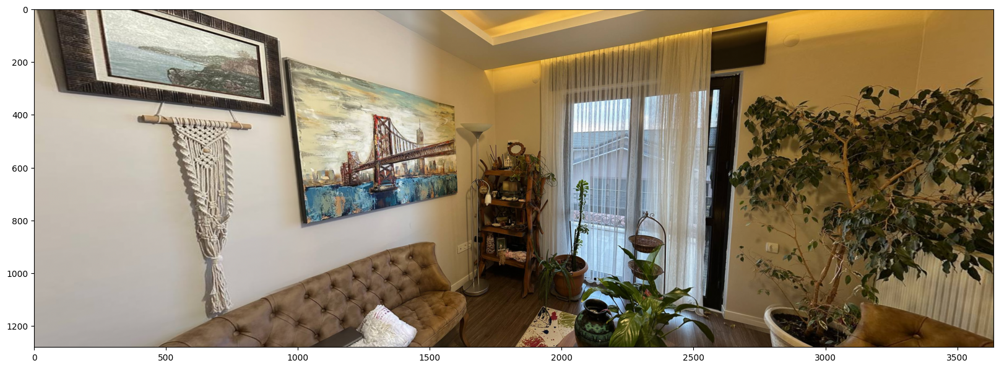

In [ ]:
def multi_stitching(list_images):
  """
  Stitches together a list of images to create a panorama using a multi-stitching approach.
  - list_images (list): List of images to be stitched. The order is crucial for correct stitching.
  Returns fullpano: Stitched panorama image.
  """

  n = int(len(list_images) / 2 + 0.5)
  left = list_images[:n]
  right = list_images[n - 1 :]
  right.reverse()
  while len(left) > 1:
    dst_img = left.pop()
    src_img = left.pop()
    left_pano, _, _, _ = warp_two_images(src_img, dst_img)
    left_pano = left_pano.astype("uint8")
    left.append(left_pano)

  while len(right) > 1:
    dst_img = right.pop()
    src_img = right.pop()
    right_pano, _, _, _ = warp_two_images(src_img, dst_img)
    right_pano = right_pano.astype("uint8")
    right.append(right_pano)

  # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
  if right_pano.shape[1] >= left_pano.shape[1]:
    fullpano, _, _, _ = warp_two_images(left_pano, right_pano)
  else:
    fullpano, _, _, _ = warp_two_images(right_pano, left_pano)
  return fullpano

panorama = multi_stitching(list_images)
plt.figure(figsize=(20,20))
img = convert_result(panorama)
plt.imshow(img)

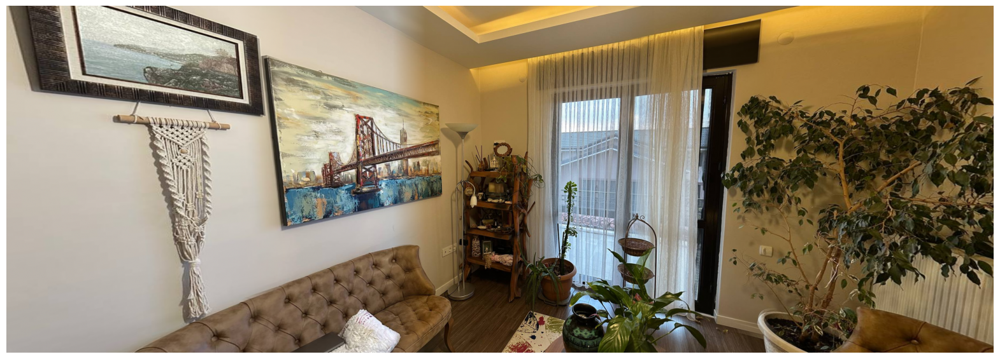

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(img)
plt.axis("off")
img[img>1] -= img[img>1]-1 # we have to do this in order to save the result
plt.imsave("result.jpg", img)

References:

- IntroToCV Lectures & Seminars in Skoltech

- https://www.mathworks.com/help/vision/ug/feature-based-panoramic-image-stitching.html;jsessionid=0fe371cef5716a3c39e8640b781d

- https://pyimagesearch.com/2016/01/11/opencv-panorama-stitching/